In [1]:
import os

import numpy as np

from astropy.convolution import Gaussian2DKernel
from astropy.io import fits
from astropy.stats import gaussian_fwhm_to_sigma
from astropy.table import QTable
import astropy.units as u
from astropy.visualization import make_lupton_rgb, SqrtStretch, ImageNormalize, simple_norm
import astropy.wcs as wcs

import photutils
print('photutils', photutils.__version__)

from photutils import Background2D, MedianBackground, detect_sources, deblend_sources, SourceCatalog#, source_properties (new API)
from photutils.utils import calc_total_error

photutils 1.5.0


In [3]:
import matplotlib.pyplot as plt
import matplotlib as mpl

# Use this version for non-interactive plots (easier scrolling of the notebook)
%matplotlib inline

# Use this version if you want interactive plots
# %matplotlib notebook

# These gymnastics are needed to make the sizes of the figures
# be the same in both the inline and notebook versions
%config InlineBackend.print_figure_kwargs = {'bbox_inches': None}

mpl.rcParams['savefig.dpi'] = 300
mpl.rcParams['figure.dpi'] = 300

In [35]:
baseurl = 'https://data.science.stsci.edu/redirect/JWST/jwst-data_analysis_tools/nircam_photometry/'
filepath = '../../ngc3324/NIRCAM_ALL_Feb172023/JWST/jw02731-o001_t017_nircam_clear-'
filters = 'f090w f187n f200w f335m f444w'.split()

# Data images [e-/s]
imagefiles = {}
for filt in filters:
    filename = f'{filt}/jw02731-o001_t017_nircam_clear-{filt}_i2d.fits'
    imagefiles[filt] = filepath + filename
    print(imagefiles[filt])



../../ngc3324/NIRCAM_ALL_Feb172023/JWST/jw02731-o001_t017_nircam_clear-f090w/jw02731-o001_t017_nircam_clear-f090w_i2d.fits
../../ngc3324/NIRCAM_ALL_Feb172023/JWST/jw02731-o001_t017_nircam_clear-f187n/jw02731-o001_t017_nircam_clear-f187n_i2d.fits
../../ngc3324/NIRCAM_ALL_Feb172023/JWST/jw02731-o001_t017_nircam_clear-f200w/jw02731-o001_t017_nircam_clear-f200w_i2d.fits
../../ngc3324/NIRCAM_ALL_Feb172023/JWST/jw02731-o001_t017_nircam_clear-f335m/jw02731-o001_t017_nircam_clear-f335m_i2d.fits
../../ngc3324/NIRCAM_ALL_Feb172023/JWST/jw02731-o001_t017_nircam_clear-f444w/jw02731-o001_t017_nircam_clear-f444w_i2d.fits


In [5]:
# 3 NIRCam short wavelength channel images
r = fits.open(imagefiles['f444w'])[1].data
g = fits.open(imagefiles['f200w'])[1].data
b = fits.open(imagefiles['f090w'])[1].data

plt.subplots_adjust(left=0.15)

print(np.shape(r))
print(np.shape(g))
print(np.shape(b))

from cbotrell_resize import rebin

# r = rebin(r, dimensions=(int(4180/2),int(7066/2)))
# g = rebin(g, dimensions=(np.shape(r)))
# b = rebin(b, dimensions=(np.shape(r)))

(4177, 7064)
(8428, 14221)
(8668, 14501)


<Figure size 1800x1200 with 0 Axes>

Set DATE-AVG to '2022-06-03T12:17:28.706' from MJD-AVG.
Set DATE-END to '2022-06-03T14:54:43.830' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -31.645194 from OBSGEO-[XYZ].
Set OBSGEO-H to 1655522354.126 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


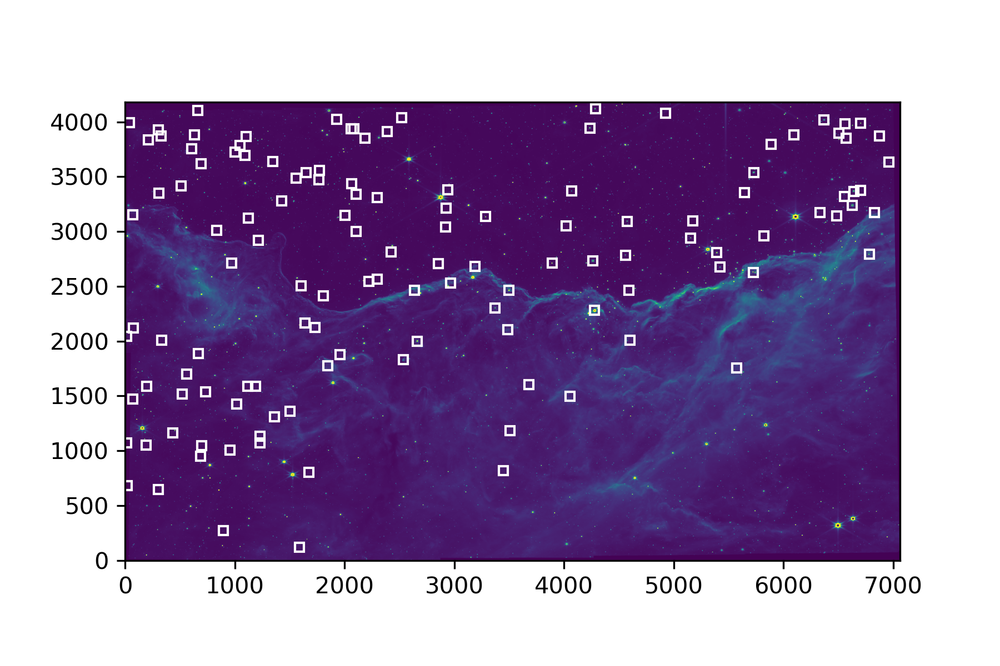

In [33]:
# # orange is 255, 165, 0 - no blue in cliffs, all red, half green
# # white is 255, 255, 255
# # black is 0, 0, 0
# # navy is 0, 0, 128 
# # light blue is 173, 216, 230
# # lime green is 50, 203, 50
# # pink is 255, 192, 203


# rgb = make_lupton_rgb(r, g, b, Q=20,minimum=(-2,16,4))#,  minimum=(-5,15,-4))  # stretch=0.02, minimum=-0.001

# fig = plt.figure(figsize=(8, 8))
# # ax = plt.subplot(projection=imwcs)
imwcs = wcs.WCS(fits.open(imagefiles['f335m'])[1].header, hdu)
x,y = imwcs.world_to_pixel(SkyCoord(ra,dec,unit='deg'))
plt.imshow(fits.open(imagefiles['f335m'])[1].data, origin='lower',vmax=80)
ax = plt.subplot()
ax.plot(x,y,marker='s',markersize=4,markerfacecolor="None", markeredgecolor='w',linestyle="None", label = 'YSO')
# plt.xlabel('Right Ascension')
# plt.ylabel('Declination')
# fig.tight_layout()

In [117]:

import PIL.Image as im

filt = 'f444w'
infile = imagefiles[filt]
hdu = fits.open(infile)
data = hdu[1].data
imwcs = wcs.WCS(hdu[1].header, hdu)

import pandas as pd
from astropy.coordinates import SkyCoord

cc = pd.read_csv("CC_Webb_Predictions_Prob_Feb172023.csv")




cc = cc[cc['Class']==0]
sp = cc[cc['SPICY_Class_0/1']==0]

(4177, 7064)
(8441, 14575, 3)


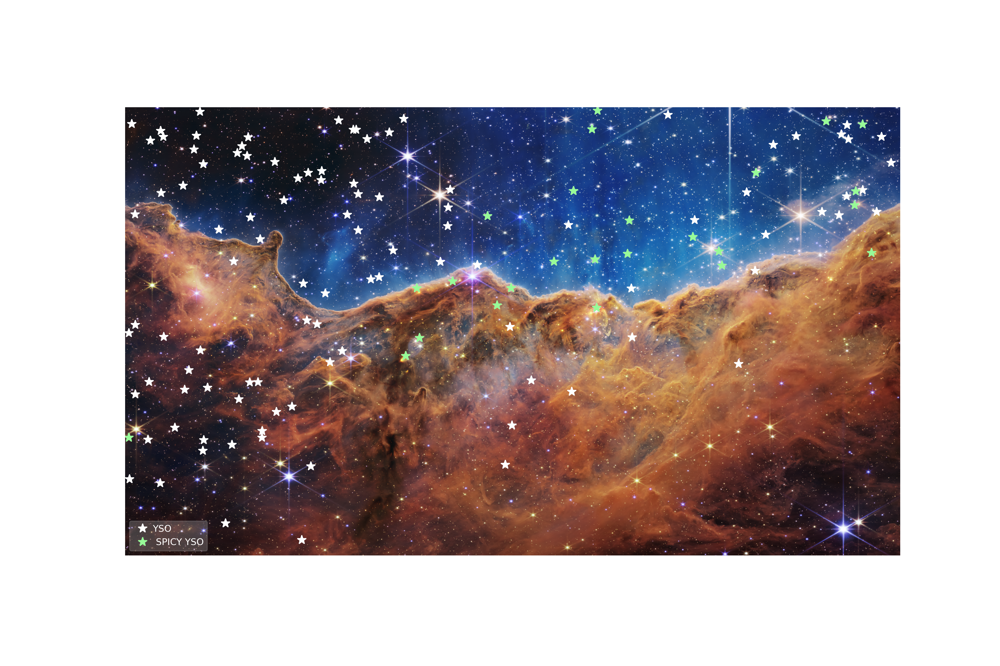

In [118]:

plt.subplots(figsize=(15,10))

ax = plt.subplot()
full_colour = im.open("../../../../Downloads/carina_nebula.png")
plt.imshow(full_colour)

ra, dec = cc.RA.values, cc.DEC.values
x,y = imwcs.world_to_pixel(SkyCoord(ra,dec,unit='deg'))
print(np.shape(data))
print(np.shape(full_colour))
ax.plot(x/(7064/np.shape(full_colour)[1])+40,np.shape(full_colour)[0]-60-y/(4177/np.shape(full_colour)[0]),marker='*',markersize=10, color='w',linestyle="None", label = 'YSO')
ra, dec = sp.RA.values, sp.DEC.values
x,y = imwcs.world_to_pixel(SkyCoord(ra,dec,unit='deg'))
ax.plot(x/(7064/np.shape(full_colour)[1])+40,np.shape(full_colour)[0]-60-y/(4177/np.shape(full_colour)[0]),marker='*',markersize=10,color='palegreen',linestyle="None", label = ' SPICY YSO')
plt.axis('off')
plt.legend(labelcolor='w',framealpha=0.2,handletextpad=0.1)
plt.savefig("Figures/Col_w_mark_no_change_spitz_green.png", bbox_inches='tight',dpi=300)

In [51]:
# subset = cc[cc['Class']==0]

filters.append("Full Colour")

6697


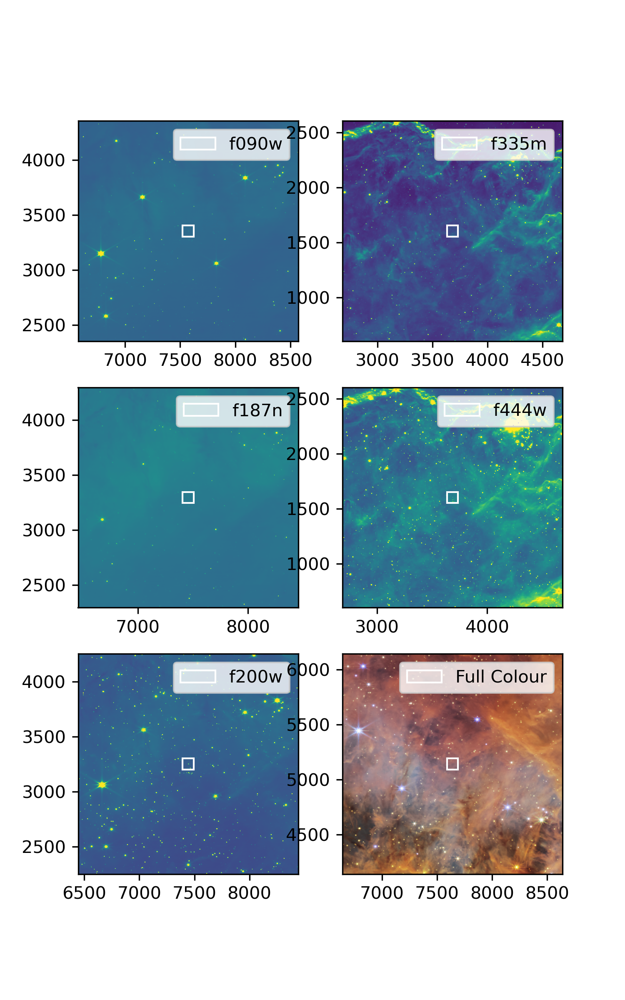

In [141]:
import warnings
warnings.filterwarnings("ignore")
import matplotlib.patches as patches

i +=1
print(cc.index[i])
box_set = 1000

l = 0 


# Make figure that shows 5 NirCam bands and colour image
fig, axs = plt.subplots(3,2,figsize=(5,8))


for j in [0,1]:
    for k in [0,1,2]:
        # Plot image
        if l < len(imagefiles):
            tmp_f = fits.open(imagefiles[filters[l]])[1]
            if filters[l] == "f187n":
                axs[k][j].imshow(tmp_f.data,vmax=100,origin='lower')
            elif filters[l] == "f335m":
                axs[k][j].imshow(tmp_f.data,vmax=30,origin='lower')
            else:
                axs[k][j].imshow(tmp_f.data,vmax=10,origin='lower')
            x, y = wcs.WCS(tmp_f.header, hdu).world_to_pixel(SkyCoord(cc.RA.iloc[i], cc.DEC.iloc[i],unit='deg'))

        else:
            axs[k][j].imshow(full_colour,origin='lower')
            x, y = x/(np.shape(tmp_f.data)[1]/np.shape(full_colour)[1])+40, np.shape(full_colour)[0]-60-y/(np.shape(tmp_f.data)[0]/np.shape(full_colour)[0])

            # axs[k][j].legend(["Full Colour"])
        # Plot boxes on top of image
        # x, y = w_jwst.world_to_pixel(SkyCoord(match_pot.RA.iloc[l], match_pot.DEC.iloc[l],unit='deg'))
        n = 100
        box = patches.Rectangle((x-n/2, y-n/2), n, n, linewidth=1, edgecolor='w', facecolor='none')
        axs[k][j].add_patch(box)
        axs[k][j].set_xlim(x-box_set,x+box_set)
        axs[k][j].set_ylim(y-box_set,y+box_set)
        

        axs[k][j].legend([filters[l]])
        l += 1

# print(i)

Make stars
Make SPICY detections different colours
Hist of Spitzer fluxes vs JWST fluxes for 444 (why didn't Spitzer see them)
